# compile SED data
The SED data generated from 
1. $\theta_{\rm SPS}'\sim p(\theta_{\rm SPS})$ --- sample SPS parameters from prior
2. $f_\lambda' = S(\theta_{\rm SPS}$ where $S$ is the SED model --- generate SED for sampled parameters
3. $m = F(f_\lambda')$ --- generate magnitude $m$ by forward modeling with $F$ the SED

Compile them for easier I/O later on

In [1]:
import os, sys
import numpy as np
from scipy.interpolate import interp1d
from scipy.stats import binned_statistic
sys.path.append(os.path.join(os.path.dirname(os.path.abspath('.'))))
import sedflow as SEDflow
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

In [2]:
dat_dir = '/scratch/network/chhahn/arcoiris/sedflow/'

In [3]:
def f_data(i, typ): 
    return os.path.join(dat_dir, 'train.v0.1.%i.%s.npy' % (i, typ))

In [6]:
xs_flux, xs_mags, zreds = [], [], []
props, thetas_unt, thetas_sps = [], [], [] 
for i in list(range(20)): 
    xs_flux.append(np.load(f_data(i, 'flux.nonoise')))
    xs_mags.append(np.load(f_data(i, 'mags.nonoise')))
    zreds.append(np.load(f_data(i, 'redshifts'))[:,None])    
    
    props.append(np.load(f_data(i, 'props')))
    thetas_unt.append(np.load(f_data(i, 'thetas_unt')))
    thetas_sps.append(np.load(f_data(i, 'thetas_sps')))
    
xs_flux = np.concatenate(xs_flux)
xs_mags = np.concatenate(xs_mags)
zreds = np.concatenate(zreds)

props = np.concatenate(props)
thetas_unt = np.concatenate(thetas_unt)
thetas_sps = np.concatenate(thetas_sps)

## observables in flux-space

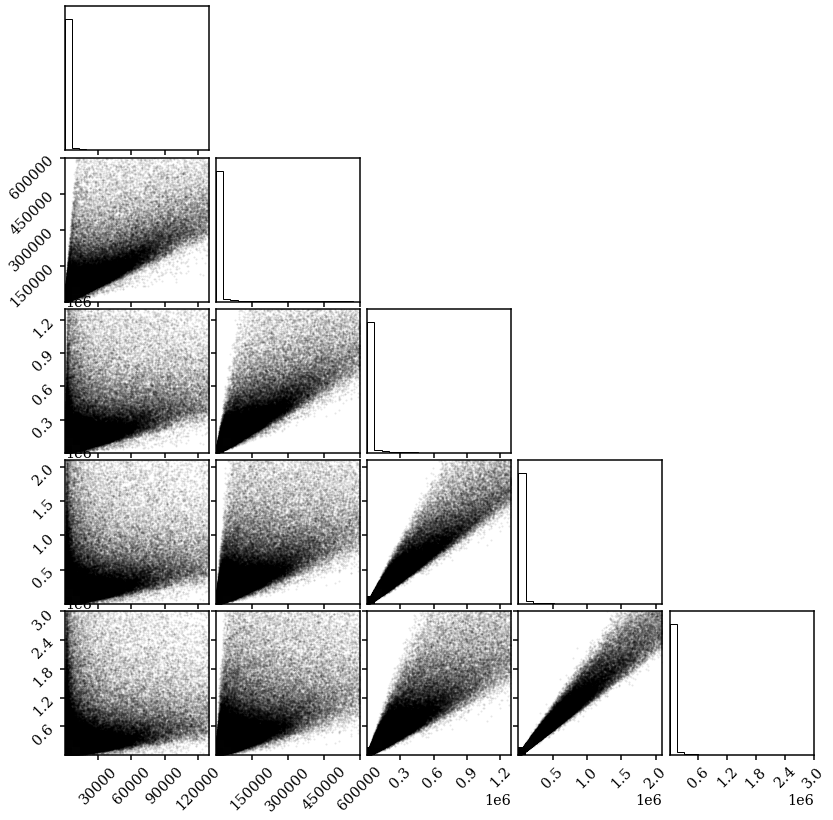

In [7]:
fig = DFM.corner(xs_flux, range=[(0., 1.3e5), (0., 6e5), (0, 1.3e6), (0., 2.1e6), (0., 3.e6)])

## observables in magnitude-space

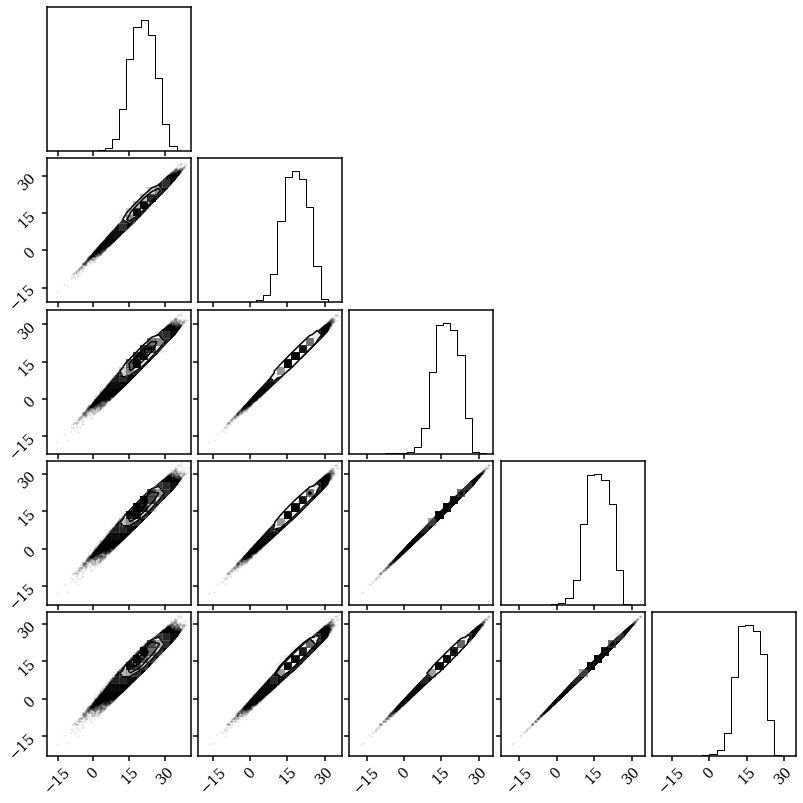

In [8]:
fig = DFM.corner(xs_mags)#, range=[(0., 1.3e5), (0., 6e5), (0, 1.3e6), (0., 2.1e6), (0., 3.e6)])

## galaxy properties

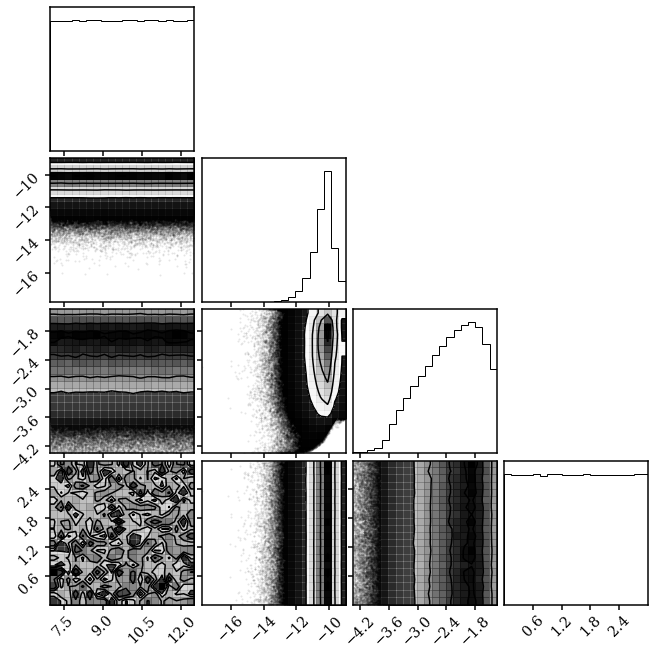

In [9]:
fig = DFM.corner(props)

### SPS parameters

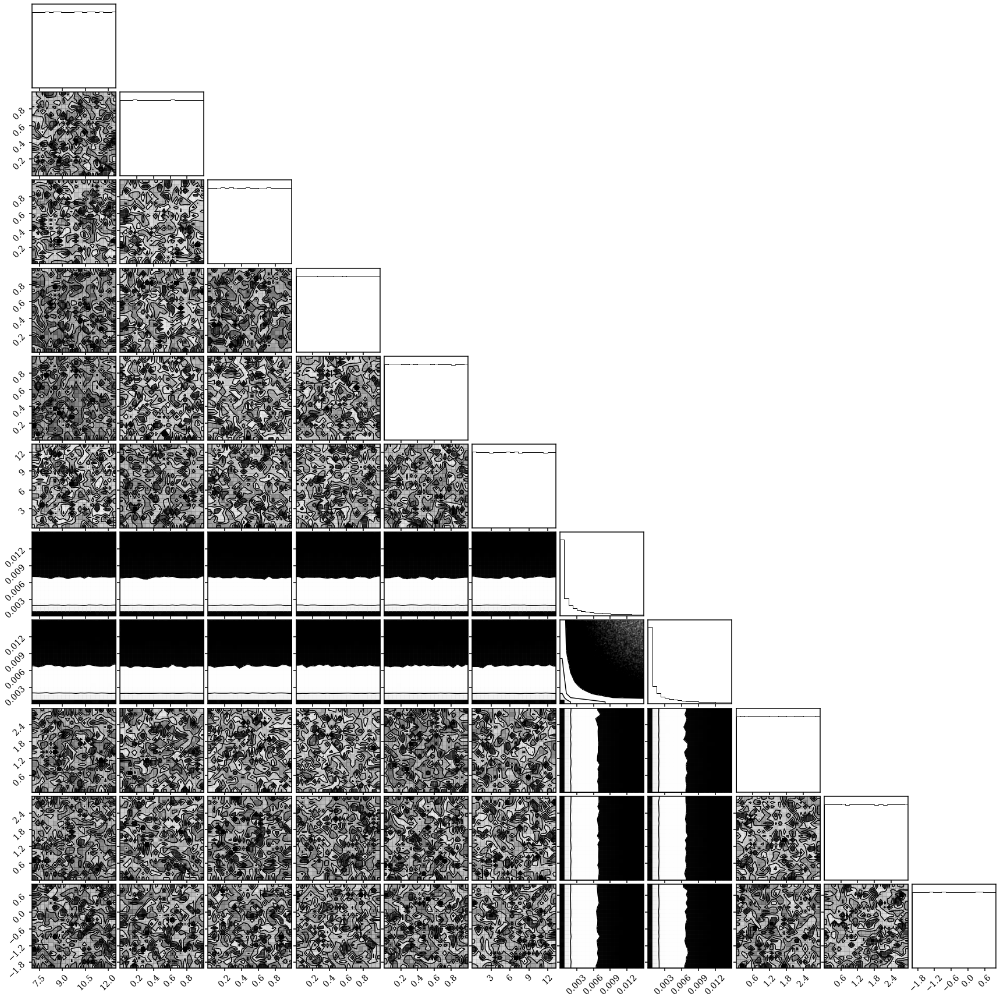

In [10]:
fig = DFM.corner(thetas_unt)

In [11]:
np.save(os.path.join(dat_dir, 'data.flux_nonoise.npy'), xs_flux)
np.save(os.path.join(dat_dir, 'data.mags_nonoise.npy'), xs_mags)
np.save(os.path.join(dat_dir, 'data.zreds.npy'), zreds)

np.save(os.path.join(dat_dir, 'data.props.npy'), props)
np.save(os.path.join(dat_dir, 'data.thetas_unt.npy'), thetas_unt)
np.save(os.path.join(dat_dir, 'data.thetas_sps.npy'), thetas_sps)

# apply toy noise model
Toy noise model assumes that the SNRs of each photometric bands are independent with one another. According to NSA, this isn't the worst assumption...?

In [12]:
nsa, _ = SEDflow.NSA()

flux_nsa = nsa['NMGY'][:,2:]
ivar_nsa = nsa['NMGY_IVAR'][:,2:]

zred_nsa = nsa['Z']

mags_nsa = SEDflow.flux2mag(flux_nsa)
sigs_nsa = SEDflow.sigma_flux2mag(ivar_nsa**-0.5, flux_nsa)

snrs_nsa = flux_nsa * ivar_nsa**0.5

/home/chhahn/projects/arcoiris/bin/sedflow/sedflow.py:178: RuntimeWarning: invalid value encountered in log10
  return 22.5 - 2.5 * np.log10(flux)


We want to base the noise model on the noise distribution of NSA

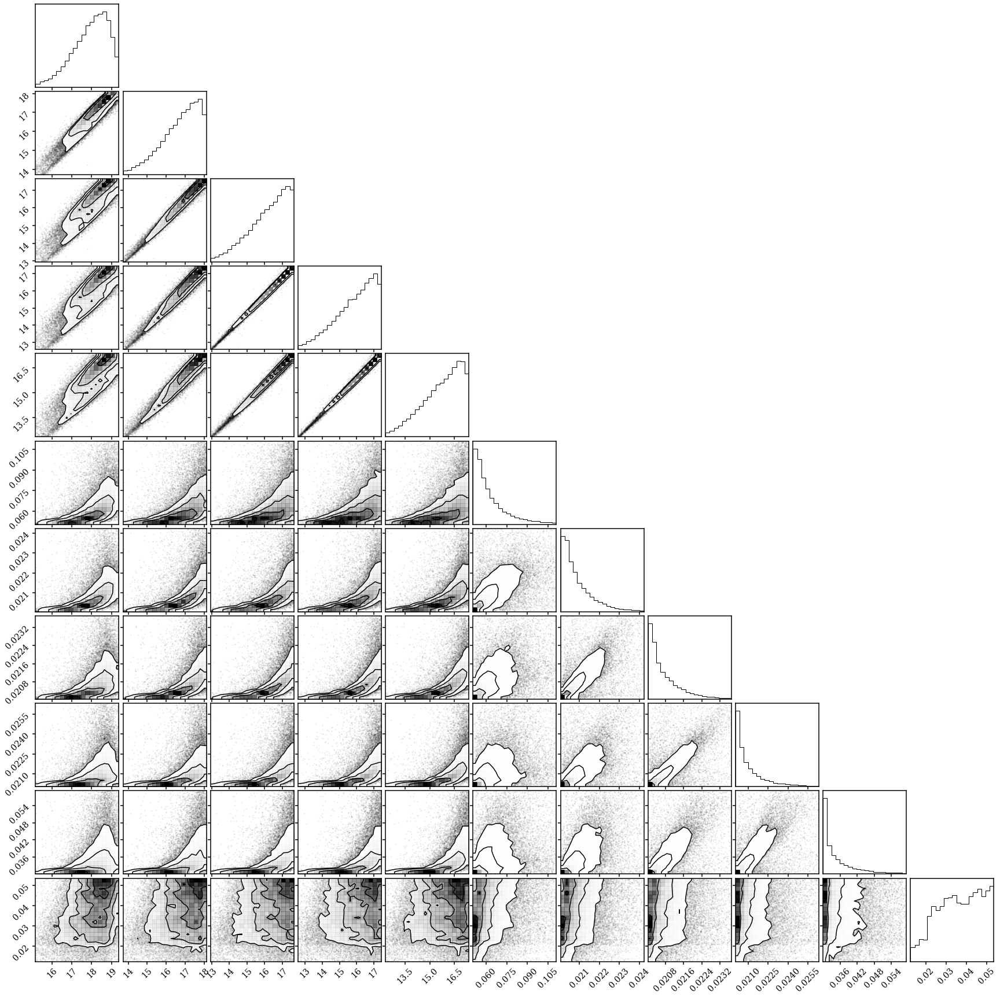

In [13]:
fig = DFM.corner(np.concatenate([mags_nsa, sigs_nsa, zred_nsa[:,None]], axis=1), 
                 range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa, zred_nsa[:,None]], axis=1), [0.01, 0.95], axis=0).T)

In [14]:
def trimmed_median(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.median(x[(x > xlim[0]) & (x < xlim[1])])

def trimmed_std(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.std(x[(x > xlim[0]) & (x < xlim[1])])

/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWa

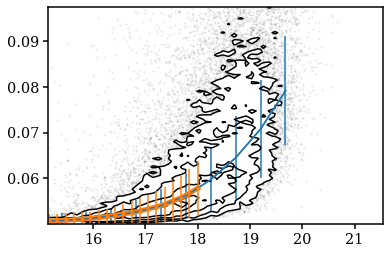

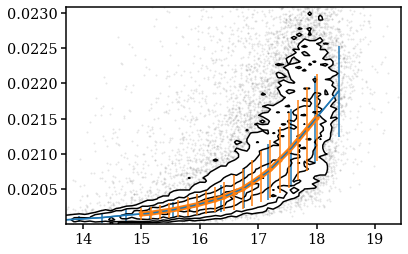

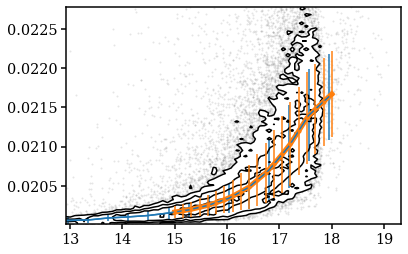

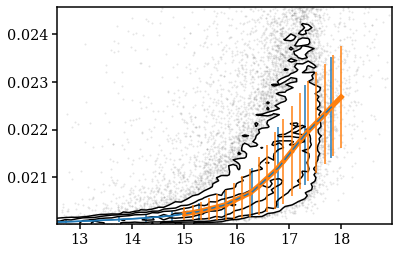

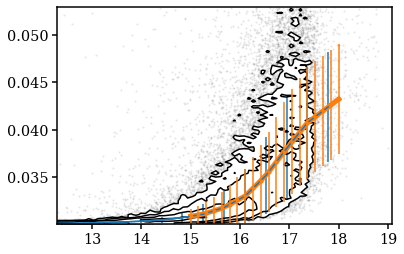

In [15]:
meds_sigs, stds_sigs = [], [] 

for i in range(5): 
    clean = (np.isfinite(mags_nsa[:,i]) & 
             (sigs_nsa[:,i] < np.quantile(sigs_nsa[:,i], 0.95)))
    
    med_sig, mags_edges, _ = binned_statistic(mags_nsa[clean,i], sigs_nsa[clean,i], statistic=trimmed_median, range=np.nanquantile(mags_nsa[clean,i], [0., 0.995]), bins=20)
    std_sig, mags_edges, _ = binned_statistic(mags_nsa[clean,i], sigs_nsa[clean,i], statistic=trimmed_std, range=np.nanquantile(mags_nsa[clean,i], [0., 0.995]), bins=20)
    
    meds_sigs.append(interp1d(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig, fill_value='extrapolate'))
    stds_sigs.append(interp1d(0.5*(mags_edges[1:] + mags_edges[:-1]), std_sig, fill_value='extrapolate'))
    
    fig = plt.figure(figsize=(6,4))
    sub = fig.add_subplot(111)
    sub.plot(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig, c='C0')
    sub.errorbar(0.5*(mags_edges[1:] + mags_edges[:-1]), med_sig,
                 yerr=std_sig, c='C0')
    DFM.hist2d(mags_nsa[clean,i], sigs_nsa[clean,i], plot_density=False, bins=100, ax=sub)
    
    sub.plot(np.linspace(15, 18, 20), meds_sigs[-1](np.linspace(15, 18, 20)), c='C1', lw=5)
    sub.errorbar(np.linspace(15, 18, 20), meds_sigs[-1](np.linspace(15, 18, 20)), 
                 yerr=stds_sigs[-1](np.linspace(15, 18, 20)), fmt='.C1')
    sub.set_xlim(np.nanquantile(mags_nsa[clean,i], [0.01, 1.]))
    sub.set_ylim(np.nanquantile(sigs_nsa[clean,i], [0.0, 0.975]))


In [16]:
def apply_toy_noise(flux, mags): 
    ''' apply toy noise model
    '''
    sigs_noisy, sigs_flux_noisy = [], [] 
    flux_noisy, mags_noisy = [], []
    for i in range(5):
        _sig_mags = meds_sigs[i](mags[:,i]) + stds_sigs[i](mags[:,i]) * np.random.normal(size=mags.shape[0])
        _sig_flux = SEDflow.sigma_mag2flux(_sig_mags, mags[:,i])
        
        _flux_noisy = flux[:,i] + _sig_flux * np.random.normal(size=mags.shape[0])
        _mags_noisy = SEDflow.flux2mag(_flux_noisy)
    
        sigs_noisy.append(_sig_mags)
        sigs_flux_noisy.append(_sig_flux)
        
        flux_noisy.append(_flux_noisy)
        mags_noisy.append(_mags_noisy)
    
    sigs_noisy = np.array(sigs_noisy).T
    sigs_flux_noisy = np.array(sigs_flux_noisy).T
    flux_noisy = np.array(flux_noisy).T
    mags_noisy = np.array(mags_noisy).T
    
    return mags_noisy, flux_noisy, sigs_noisy, sigs_flux_noisy

In [17]:
xs_flux = np.load(os.path.join(dat_dir, 'data.flux_nonoise.npy'))
xs_mags = np.load(os.path.join(dat_dir, 'data.mags_nonoise.npy'))
zreds = np.load(os.path.join(dat_dir, 'data.zreds.npy'))

props = np.load(os.path.join(dat_dir, 'data.props.npy'))
thetas_unt = np.load(os.path.join(dat_dir, 'data.thetas_unt.npy'))
thetas_sps = np.load(os.path.join(dat_dir, 'data.thetas_sps.npy'))

mags_noisy, flux_noisy, sigs_noisy, sigs_flux_noisy = apply_toy_noise(xs_flux, xs_mags)

/home/chhahn/projects/arcoiris/bin/sedflow/sedflow.py:178: RuntimeWarning: invalid value encountered in log10
  return 22.5 - 2.5 * np.log10(flux)


In [18]:
# trim the training data
mag_cuts = np.all(np.isfinite(mags_noisy), axis=1) & np.all([(mag < cut) for mag, cut in zip(mags_noisy.T, np.nanquantile(mags_nsa, 0.99, axis=0))], axis=0)
sig_cuts = np.all(np.isfinite(sigs_noisy), axis=1) & np.all(sigs_noisy > 0., axis=1)

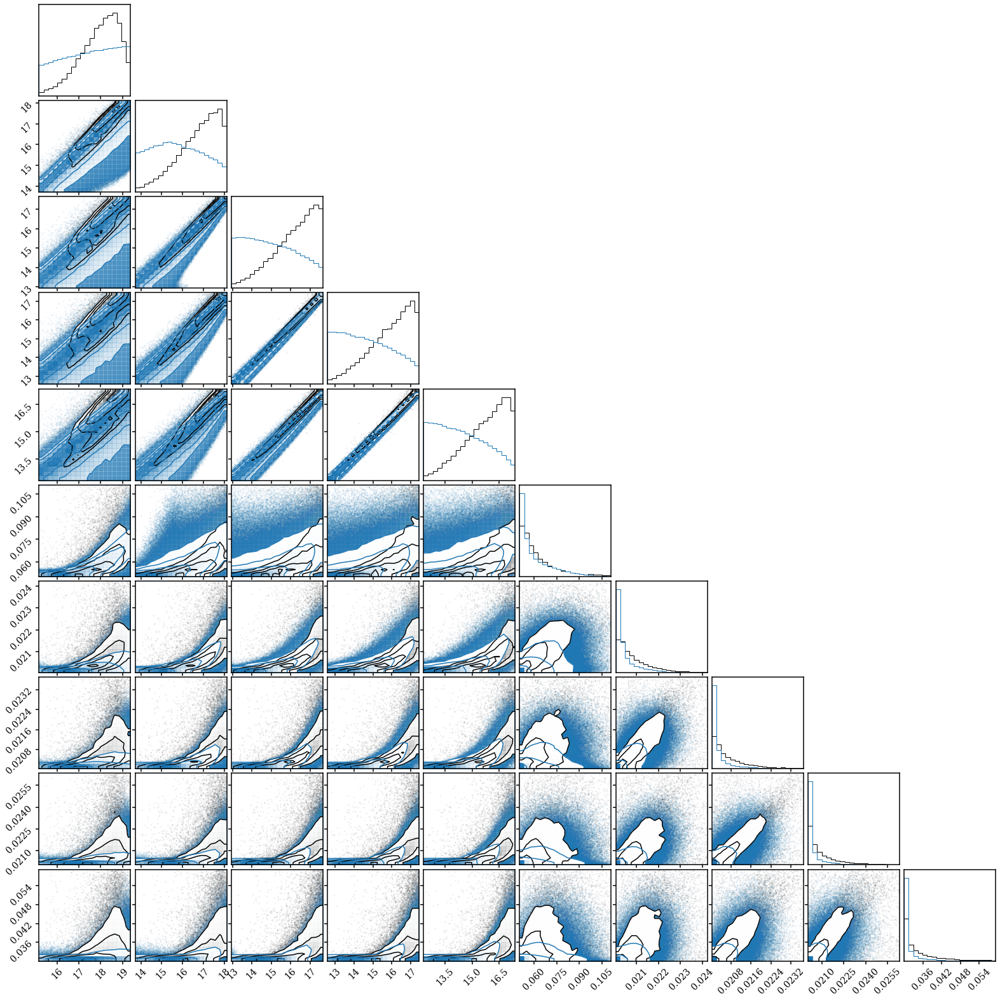

In [19]:
fig = DFM.corner(np.concatenate([mags_nsa, sigs_nsa], axis=1), 
                 range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
                 color='k', hist_kwargs={'density': True})
_ = DFM.corner(np.concatenate([mags_noisy, sigs_noisy], axis=1)[mag_cuts & sig_cuts],
               range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
               color='C0', hist_kwargs={'density': True}, fig=fig)

In [20]:
np.save(os.path.join(dat_dir, 'data.flux.toy_noise.npy'), flux_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.mags.toy_noise.npy'), mags_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.sigs_flux.toy_noise.npy'), sigs_flux_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.sigs.toy_noise.npy'), sigs_noisy[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.zred.toy_noise.npy'), zreds[mag_cuts & sig_cuts])

np.save(os.path.join(dat_dir, 'data.prop.toy_noise.npy'), props[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.thetas_unt.toy_noise.npy'), thetas_unt[mag_cuts & sig_cuts])
np.save(os.path.join(dat_dir, 'data.thetas_sps.toy_noise.npy'), thetas_sps[mag_cuts & sig_cuts])

## apply toy noise model to test data
Same noise model as above. Currently commented out so I don't overwrite it. 

In [22]:
xs_flux, xs_mags, zreds = [], [], []
props, thetas_unt, thetas_sps = [], [], [] 
for i in [101]: 
#     xs_flux.append(np.load(f_data(i, 'flux.nonoise')))
#     xs_mags.append(np.load(f_data(i, 'mags.nonoise')))
#     zreds.append(np.load(f_data(i, 'redshifts'))[:,None])
#    props.append(np.load(f_data(i, 'props')))
    thetas_unt.append(np.load(f_data(i, 'thetas_unt')))
    thetas_sps.append(np.load(f_data(i, 'thetas_sps')))    
    
#xs_flux = np.concatenate(xs_flux)
#xs_mags = np.concatenate(xs_mags)
#zreds = np.concatenate(zreds)

# props = np.concatenate(props)
thetas_unt = np.concatenate(thetas_unt)
thetas_sps = np.concatenate(thetas_sps)

# np.save(os.path.join(dat_dir, 'test.flux_nonoise.npy'), xs_flux)
# np.save(os.path.join(dat_dir, 'test.mags_nonoise.npy'), xs_mags)
# np.save(os.path.join(dat_dir, 'test.zreds.npy'), zreds)

# np.save(os.path.join(dat_dir, 'test.props.npy'), props)
np.save(os.path.join(dat_dir, 'test.thetas_unt.npy'), thetas_unt)
np.save(os.path.join(dat_dir, 'test.thetas_sps.npy'), thetas_sps)

In [29]:
# the script below is to posthoc get theta_unt and theta_sps for the noisy test data
props = np.load(os.path.join(dat_dir, 'test.props.npy'))
props_noisy = np.load(os.path.join(dat_dir, 'test.prop.toy_noise.npy'))

i_noisy = []
for _props in props_noisy: 
    is_match = np.sum(np.abs(props - _props), axis=1) == 0.
    assert np.sum(is_match) == 1
    
    i_noisy.append(np.arange(props.shape[0])[is_match])
i_noisy = np.concatenate(i_noisy)

In [ ]:
# # apply noise to test data
# xs_flux = np.load(os.path.join(dat_dir, 'test.flux_nonoise.npy'))
# xs_mags = np.load(os.path.join(dat_dir, 'test.mags_nonoise.npy'))
# props = np.load(os.path.join(dat_dir, 'test.props.npy'))
# zreds = np.load(os.path.join(dat_dir, 'test.zreds.npy'))

# mags_noisy, flux_noisy, sigs_noisy, sigs_flux_noisy = apply_toy_noise(xs_flux, xs_mags)

# mag_cuts = np.all(np.isfinite(mags_noisy), axis=1) & np.all([(mag < cut) for mag, cut in zip(mags_noisy.T, np.nanquantile(mags_nsa, 0.99, axis=0))], axis=0)
# sig_cuts = np.all(np.isfinite(sigs_noisy), axis=1) & np.all(sigs_noisy > 0., axis=1)

# np.save(os.path.join(dat_dir, 'test.flux.toy_noise.npy'), flux_noisy[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.mags.toy_noise.npy'), mags_noisy[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.sigs_flux.toy_noise.npy'), sigs_flux_noisy[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.sigs.toy_noise.npy'), sigs_noisy[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.zred.toy_noise.npy'), zreds[mag_cuts & sig_cuts])

# np.save(os.path.join(dat_dir, 'test.prop.toy_noise.npy'), props[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.thetas_unt.toy_noise.npy'), props[mag_cuts & sig_cuts])
# np.save(os.path.join(dat_dir, 'test.thetas_sps.toy_noise.npy'), props[mag_cuts & sig_cuts])

In [33]:
np.save(os.path.join(dat_dir, 'test.thetas_unt.toy_noise.npy'), thetas_unt[i_noisy])
np.save(os.path.join(dat_dir, 'test.thetas_sps.toy_noise.npy'), thetas_sps[i_noisy])

In [ ]:
fig = DFM.corner(np.concatenate([mags_nsa, sigs_nsa], axis=1), 
                 range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
                 color='k', hist_kwargs={'density': True})
_ = DFM.corner(np.concatenate([mags_noisy, sigs_noisy], axis=1)[mag_cuts & sig_cuts],
               range=np.nanquantile(np.concatenate([mags_nsa, sigs_nsa], axis=1), [0.01, 0.95], axis=0).T, 
               color='C0', hist_kwargs={'density': True}, fig=fig)

## construct "gold" test data
select a subsample of 100 data points smack in the middle of the training data

In [40]:
mags_noisy = np.load(os.path.join(dat_dir, 'test.mags.toy_noise.npy'))
sigs_noisy = np.load(os.path.join(dat_dir, 'test.sigs.toy_noise.npy'))
flux_noisy = np.load(os.path.join(dat_dir, 'test.flux.toy_noise.npy'))
sigs_flux_noisy = np.load(os.path.join(dat_dir, 'test.sigs_flux.toy_noise.npy'))
zreds_noisy = np.load(os.path.join(dat_dir, 'test.zred.toy_noise.npy'))

props_noisy = np.load(os.path.join(dat_dir, 'test.prop.toy_noise.npy'))
thetas_unt_noisy = np.load(os.path.join(dat_dir, 'test.thetas_unt.toy_noise.npy'))
thetas_sps_noisy = np.load(os.path.join(dat_dir, 'test.thetas_sps.toy_noise.npy'))

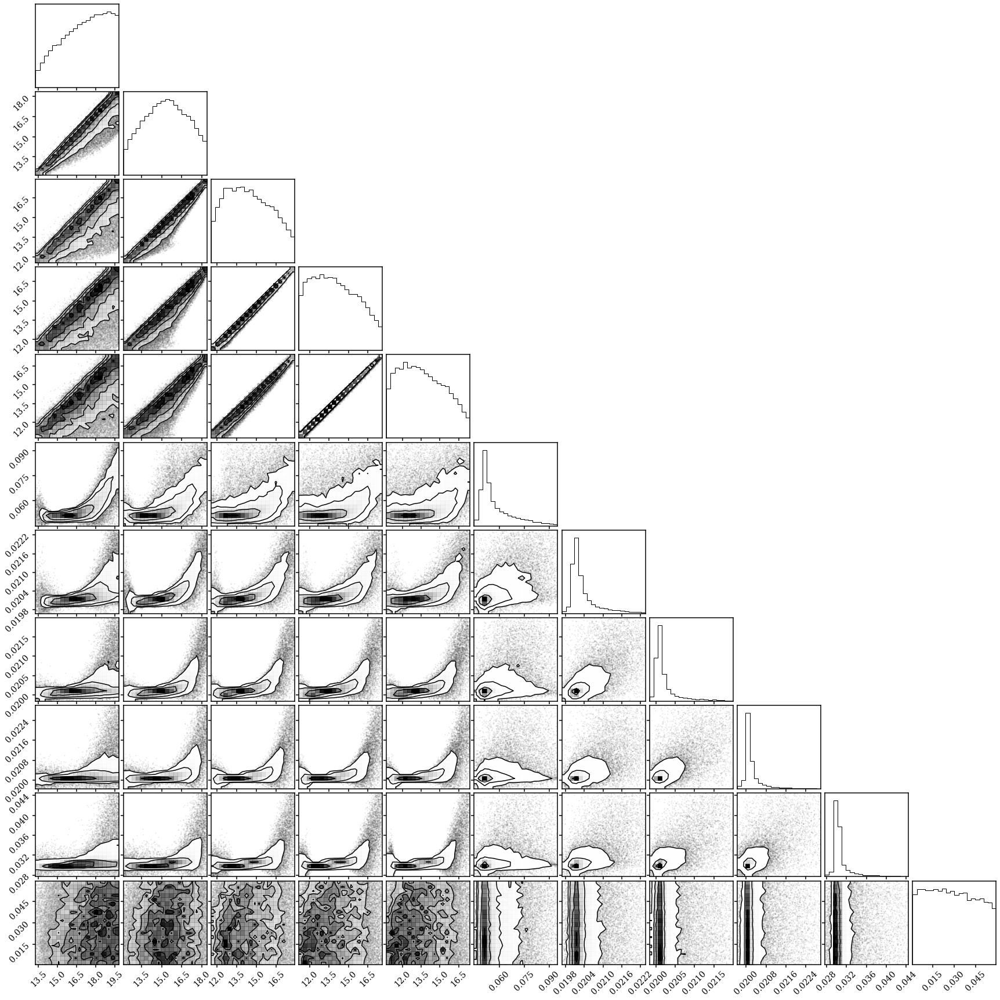

In [35]:
x = np.concatenate([mags_noisy, sigs_noisy, zreds_noisy], axis=1)
fig = DFM.corner(x, range=np.nanquantile(x, [0.01, 0.99], axis=0).T, color='k', hist_kwargs={'density': True})

In [36]:
gold = (
    (x[:,0] > 15.0) & (x[:,0] < 18) & 
    (x[:,1] > 14.0) & (x[:,1] < 16.5) & 
    (x[:,2] > 13.0) & (x[:,2] < 15.0) & 
    (x[:,3] > 13.0) & (x[:,3] < 15.0) & 
    (x[:,4] > 12.5) & (x[:,4] < 15) & 
    (x[:,5] > 0.05) & (x[:,5] < 0.053) & 
    (x[:,6] > 0.02) & (x[:,6] < 0.0202) &     
    (x[:,7] > 0.02) & (x[:,7] < 0.0202) & 
    (x[:,8] > 0.02) & (x[:,8] < 0.0202) &
    (x[:,9] > 0.03) & (x[:,8] < 0.0305)    
)
print(np.sum(gold))

1841


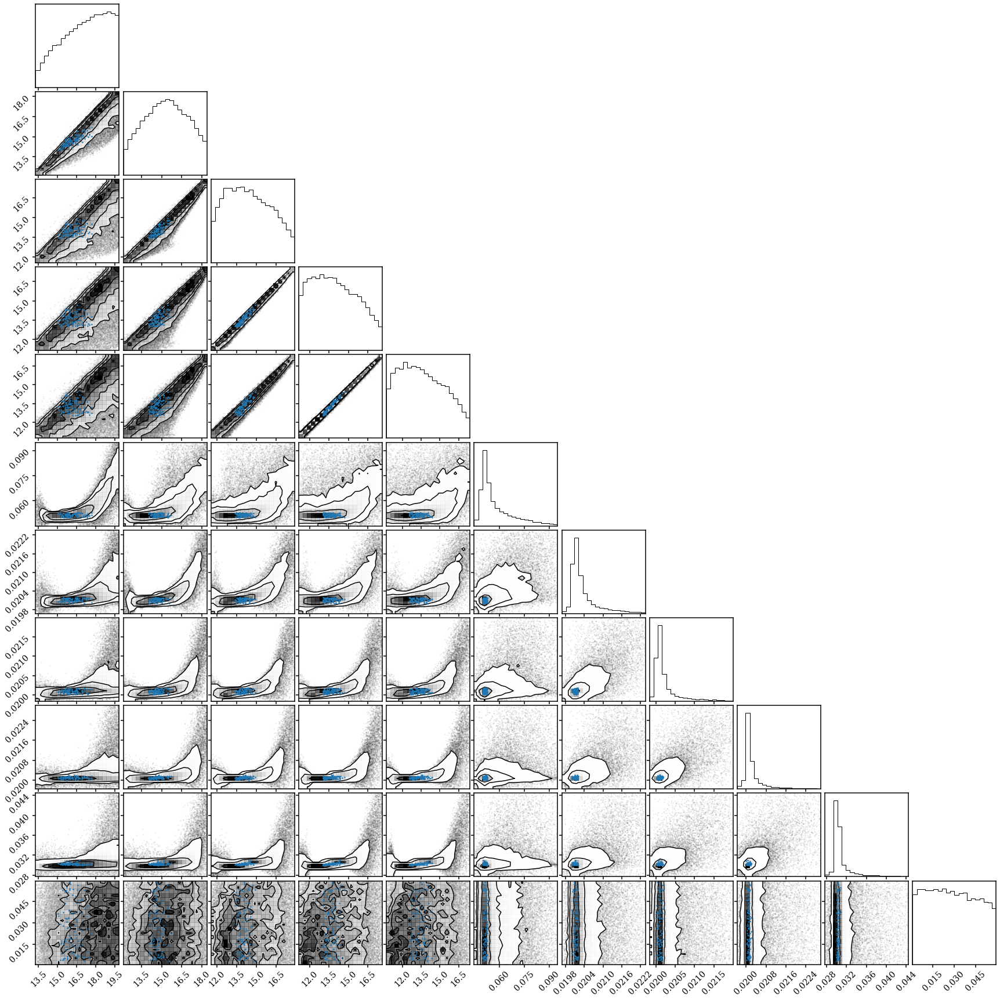

In [37]:
fig = DFM.corner(x, range=np.nanquantile(x, [0.01, 0.99], axis=0).T, color='k', hist_kwargs={'density': True})
DFM.overplot_points(fig, x[gold][:100], markersize=3)

In [41]:
np.save(os.path.join(dat_dir, 'test.gold.flux.toy_noise.npy'), flux_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.mags.toy_noise.npy'), mags_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.sigs_flux.toy_noise.npy'), sigs_flux_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.sigs.toy_noise.npy'), sigs_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.zred.toy_noise.npy'), zreds_noisy[gold][:100])

np.save(os.path.join(dat_dir, 'test.gold.prop.toy_noise.npy'), props_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.thetas_unt.toy_noise.npy'), thetas_unt_noisy[gold][:100])
np.save(os.path.join(dat_dir, 'test.gold.thetas_sps.toy_noise.npy'), thetas_sps_noisy[gold][:100])